In [1]:
import gc
import pandas as pd
import scanpy as sc
import numpy as np
sc.settings.verbosity = 2
sc.settings.set_figure_params(dpi=150, color_map='viridis')
sc.logging.print_versions()

# Parameters
num_top_genes = 2000
out_path = "/workspace/251217_sysvi_integration/result/"

from scipy.io import mmread
import anndata as ad

import matplotlib.pyplot as plt

In [2]:
def add_anot(adata, cell_annot_info):
    """
    Adding annotations

    Parameters
    ----------
    adata
        AnnData object.
    cell_annot_info
        DataFrame object. The columns must contain ['cell', 'annot'].
    --------
    """
    print("=== cell_annot_info の情報 ===")
    print(f"アノテーション情報がある細胞数: {len(cell_annot_info)}")
    print(f"細胞タイプの種類数: {cell_annot_info['annot'].nunique()}")
    print("細胞タイプの分布:")
    print(cell_annot_info['annot'].value_counts())

    # cell_annot_infoに登録されている細胞のみでadataをフィルタリング
    print(f"\n=== フィルタリング前のadata ===")
    print(f"総細胞数: {adata.n_obs}")
    # アノテーション情報がある細胞のみを抽出
    annotated_cells = set(cell_annot_info['cell'])
    adata_obs_cells = set(adata.obs_names)
    # 共通する細胞を特定
    common_cells = annotated_cells & adata_obs_cells
    print(f"アノテーション情報がある細胞数: {len(annotated_cells)}")
    print(f"adataに含まれる細胞数: {len(adata_obs_cells)}")
    print(f"共通する細胞数: {len(common_cells)}")
    # 共通する細胞のリストを作成（順序を保持）
    common_cells_ordered = [cell for cell in adata.obs_names if cell in common_cells]
    # adataを共通する細胞のみでフィルタリング
    adata = adata[common_cells_ordered, :].copy()
    print(f"\n=== フィルタリング後のadata ===")
    print(f"フィルタリング後の細胞数: {adata.n_obs}")

    # アノテーション情報をadataに追加
    # cell_annot_infoをインデックスでマージしやすい形に変換
    cell_annot_dict = dict(zip(cell_annot_info['cell'], cell_annot_info['annot']))
    # adata.obsにアノテーション情報を追加
    adata.obs['cell_type'] = [cell_annot_dict[cell] for cell in adata.obs_names]
    print(f"\n細胞タイプの分布:")
    print(adata.obs['cell_type'].value_counts())

    # 名前の重複対策
    adata.var_names_make_unique()
    adata.obs_names_make_unique()

    return adata

## Data prerpo & QC ##

### Liver ###

In [5]:
BASE_DIR = "/workspace/data/livercellatlas_human"

In [6]:
# データが格納されているフォルダのパス
data_folder = BASE_DIR+"/rawData_human/countTable_human"

# --- 1. 3つのファイルを個別に読み込む ---

# カウント行列を読み込む
matrix_path = f"{data_folder}/matrix.mtx.gz"
matrix = mmread(matrix_path)

# 細胞のバーコードを読み込む
barcodes_path = f"{data_folder}/barcodes.tsv.gz"
barcodes = pd.read_csv(barcodes_path, header=None, sep='\t')

# 遺伝子情報を読み込む
features_path = f"{data_folder}/features.tsv.gz"
features = pd.read_csv(features_path, header=None, sep='\t')


# --- 2. AnnDataオブジェクトを組み立てる ---

# AnnDataオブジェクトを作成
# 注意: mmreadで読み込んだ行列は (遺伝子 x 細胞) のため、転置 (.T) する必要がある
adata = ad.AnnData(X=matrix.T.tocsr(),
                        obs=pd.DataFrame(index=barcodes[0].values),
                        var=pd.DataFrame(index=features[0].values))

# 遺伝子名を一意にする
adata.var_names_make_unique()

# --- 3. 結果の確認 ---
print("--- AnnData object created successfully ---")
print(adata)

--- AnnData object created successfully ---
AnnData object with n_obs × n_vars = 272867 × 32738


In [7]:
# --- Human Version ---

# 1. ミトコンドリア遺伝子 (Mitochondrial genes)
adata.var["mt"] = adata.var_names.str.startswith("MT-")

# 2. リボソーム遺伝子 (Ribosomal genes)
adata.var["ribo"] = adata.var_names.str.upper().str.startswith(("RPS", "RPL"))

# 3. ヘモグロビン遺伝子 (Hemoglobin genes)
adata.var["hb"] = adata.var_names.str.startswith("HB")

sc.pp.calculate_qc_metrics(
    adata, qc_vars=["mt", "ribo", "hb"], inplace=True, log1p=True
)

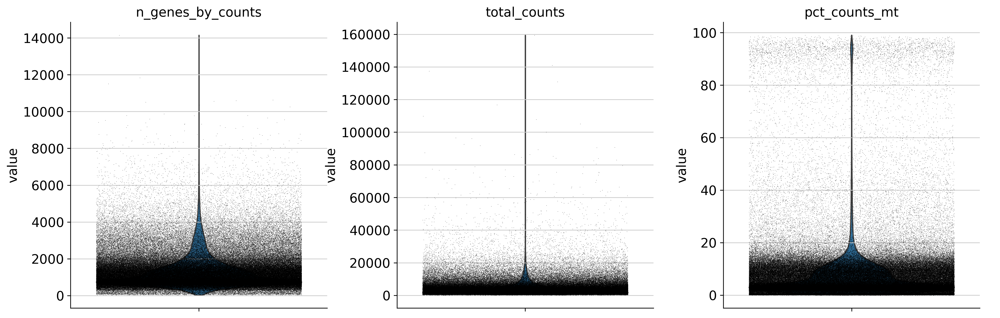

In [8]:
sc.pl.violin(
    adata,
    ["n_genes_by_counts", "total_counts", "pct_counts_mt"],
    jitter=0.4,
    size=0.4,
    multi_panel=True,
)
# total_countsがRNAの総量でn_genes_by_countsはその細胞でカウントが1以上になった遺伝子の数

In [9]:
# 発現遺伝子が100未満かつ3細胞未満で検出される遺伝子を有する細胞のみをフィルタリング対象とします。
sc.pp.filter_cells(adata, min_genes=200) # 分布のグラフから、また、Geminiが200がデフォって言ったから
sc.pp.filter_cells(adata, max_genes=6000) # 分布のグラフから、こっちはダブレットの除去でどうにかなりそう
sc.pp.filter_genes(adata, min_cells=3)

filtered out 3456 cells that have less than 200 genes expressed
filtered out 723 cells that have more than 6000 genes expressed
filtered out 1906 genes that are detected in less than 3 cells


In [10]:
# Annotationデータの読み込み
info_df = pd.read_csv(BASE_DIR+"/annot_humanAll.csv")
# sample情報の追加
cell_sample_set = set([(info_df.loc[i, "sample"], info_df.loc[i, "cell"].split("-")[-1]) for i in info_df.index])
cell_sample_dict = {i[1] : i[0] for i in cell_sample_set}
adata.obs["sample"] = [cell_sample_dict[ind.split("-")[-1]] for ind in adata.obs.index]

In [11]:
# そのままダブレット除去をやるとエラーが起きるので30細胞未満のサンプルを除外

# 各サンプルの細胞数をカウント
sample_counts = adata.obs['sample'].value_counts()

# 30細胞未満のサンプルを特定
small_samples = sample_counts[sample_counts < 30].index.tolist()
print(f"細胞数が少なすぎるため除外するサンプル: {small_samples}")

# スライスした結果のコピーを作成し、adataを上書きする
adata = adata[~adata.obs['sample'].isin(small_samples)].copy()

# 除外後のデータで再度Scrubletを実行
sc.pp.scrublet(adata, batch_key="sample")

細胞数が少なすぎるため除外するサンプル: []
Running Scrublet
filtered out 11348 genes that are detected in less than 3 cells
normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:01)
normalizing counts per cell
    finished (0:00:00)
normalizing counts per cell
    finished (0:00:00)
Embedding transcriptomes using PCA...
    using data matrix X directly
Automatically set threshold at doublet score = 0.17
Detected doublet rate = 1.3%
Estimated detectable doublet fraction = 2.8%
Overall doublet rate:
	Expected   = 5.0%
	Estimated  = 48.0%
filtered out 14117 genes that are detected in less than 3 cells
normalizing counts per cell
    finished (0:00:01)
extracting highly variable genes
    finished (0:00:01)
normalizing counts per cell
    finished (0:00:00)
normalizing counts per cell
    finished (0:00:01)
Embedding transcriptomes using PCA...
    using data matrix X directly
Automatically set threshold at doublet score = 0.64
Detected doublet rate = 0.0%
Est

In [13]:
# フィルタリング前の細胞数を確認
print(f"Cells before Scrublet filtering: {adata.n_obs}")

# predicted_doublet が True の細胞の数を確認
doublet_count = adata.obs['predicted_doublet'].sum()
print(f"Predicted doublets: {doublet_count}")

# predicted_doublet が False の細胞だけを選択して adata を上書き
adata = adata[adata.obs['predicted_doublet'] == False, :]

# フィルタリング後の細胞数を確認
print(f"Cells after Scrublet filtering: {adata.n_obs}")

Cells before Scrublet filtering: 267959
Predicted doublets: 0
Cells after Scrublet filtering: 267959


In [14]:
adata

View of AnnData object with n_obs × n_vars = 267959 × 30832
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'n_genes', 'sample', 'doublet_score', 'predicted_doublet'
    var: 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
    uns: 'scrublet'

In [15]:
# 一旦ここでデータを保存する
adata.write("/workspace/251217_sysvi_integration/result/liver_adata_qconly_267959x30832.h5ad")

/opt/250102_test_env/lib/python3.11/site-packages/anndata/_core/anndata.py:1180: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


### pbmc ###

In [17]:
BASE_DIR = "/workspace/data/6kpbmc/"
data_path = BASE_DIR+"filtered_matrices_mex/hg19/"

In [18]:
# Load PBMC 6k dataset
adata = sc.read(data_path + 'matrix.mtx').T
adata.var_names = pd.read_csv(data_path + 'genes.tsv', header=None, sep='\t')[1]
adata.obs_names = pd.read_csv(data_path + 'barcodes.tsv', header=None)[0]
adata.var_names_make_unique()
adata  # n_obs × n_vars = 5419 × 32738

AnnData object with n_obs × n_vars = 5419 × 32738

In [19]:
# mitochondrial genes, "MT-" for human, "Mt-" for mouse
adata.var["mt"] = adata.var_names.str.startswith("MT-")
# ribosomal genes
adata.var["ribo"] = adata.var_names.str.startswith(("RPS", "RPL"))
# hemoglobin genes
adata.var["hb"] = adata.var_names.str.contains("^HB[^(P)]")
sc.pp.calculate_qc_metrics(
    adata, qc_vars=["mt", "ribo", "hb"], inplace=True, log1p=True
)

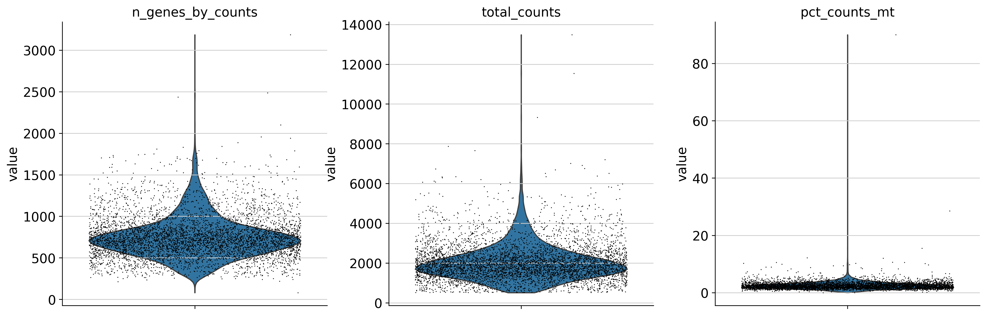

In [20]:
sc.pl.violin(
    adata,
    ["n_genes_by_counts", "total_counts", "pct_counts_mt"],
    jitter=0.4,
    multi_panel=True,
)

In [21]:
# 細胞フィルタリング
sc.pp.filter_cells(adata, min_genes=200) # 分布のグラフから、また、Geminiが200がデフォって言ったから
sc.pp.filter_cells(adata, max_genes=2500) # 分布のグラフから、こっちはダブレットの除去でどうにかなりそう
sc.pp.filter_genes(adata, min_cells=3)

filtered out 1 cells that have less than 200 genes expressed
filtered out 1 cells that have more than 2500 genes expressed
filtered out 18407 genes that are detected in less than 3 cells


In [22]:
# Scrubletを実行
sc.pp.scrublet(adata)

Running Scrublet
normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:02)
normalizing counts per cell
    finished (0:00:00)
normalizing counts per cell
    finished (0:00:00)
Embedding transcriptomes using PCA...
    using data matrix X directly
Automatically set threshold at doublet score = 0.55
Detected doublet rate = 0.1%
Estimated detectable doublet fraction = 10.3%
Overall doublet rate:
	Expected   = 5.0%
	Estimated  = 0.9%
    Scrublet finished (0:01:28)


In [23]:
# フィルタリング前の細胞数を確認
print(f"Cells before Scrublet filtering: {adata.n_obs}")

# predicted_doublet が True の細胞の数を確認
doublet_count = adata.obs['predicted_doublet'].sum()
print(f"Predicted doublets: {doublet_count}")

# predicted_doublet が False の細胞だけを選択して adata を上書き
adata = adata[adata.obs['predicted_doublet'] == False, :]

# フィルタリング後の細胞数を確認
print(f"Cells after Scrublet filtering: {adata.n_obs}")

Cells before Scrublet filtering: 5417
Predicted doublets: 5
Cells after Scrublet filtering: 5412


In [24]:
adata

View of AnnData object with n_obs × n_vars = 5412 × 14331
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'n_genes', 'doublet_score', 'predicted_doublet'
    var: 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
    uns: 'scrublet'

In [25]:
# 一旦ここでデータを保存する
adata.write("/workspace/251217_sysvi_integration/result/pbmc_adata_qconly_5412x14331.h5ad")

## sysVI ##

### prepro ###

In [3]:
# qc済みデータを読み込み

file_path = "/workspace/251217_sysvi_integration/result/liver_adata_qconly_267959x30832.h5ad"
adata_liver = sc.read_h5ad(file_path)

file_path = "/workspace/251217_sysvi_integration/result/pbmc_adata_qconly_5412x14331.h5ad"
adata_pbmc = sc.read_h5ad(file_path)

In [4]:
# Annotationデータの読み込み
info_df = pd.read_csv("/workspace/data/livercellatlas_human/annot_humanAll.csv")
cell_annot_info = info_df[['cell', 'annot']]
adata_liver = add_anot(adata_liver, cell_annot_info)

=== cell_annot_info の情報 ===
アノテーション情報がある細胞数: 167598
細胞タイプの種類数: 17
細胞タイプの分布:
annot
T cells                    77355
Mono+mono derived cells    29639
Circulating NK/NKT         12567
Hepatocytes                10996
Resident NK                10894
Macrophages                 7076
Neutrophils                 5340
Endothelial cells           2834
cDC2s                       2629
B cells                     2350
Fibroblasts                 1273
pDCs                        1216
cDC1s                       1180
Plasma cells                1125
Cholangiocytes               657
Basophils                    389
Mig.cDCs                      78
Name: count, dtype: int64

=== フィルタリング前のadata ===
総細胞数: 267959
アノテーション情報がある細胞数: 167598
adataに含まれる細胞数: 267959
共通する細胞数: 167155

=== フィルタリング後のadata ===
フィルタリング後の細胞数: 167155

細胞タイプの分布:
cell_type
T cells                    77338
Mono+mono derived cells    29637
Circulating NK/NKT         12567
Resident NK                10884
Hepatocytes                10625
M

In [5]:
# Annotationデータの読み込み
# 自前のAnnotation結果 (scanpyのフロー)
# 251028_new_annotation.ipynbを参照
info_df = pd.read_csv("/workspace/251011_data_integration/result/data_pbmc6k_celltypes.txt", sep="\t")
info_df.columns = ['cell', 'annot']
cell_annot_info = info_df[['cell', 'annot']]
adata_pbmc = add_anot(adata_pbmc, cell_annot_info)

=== cell_annot_info の情報 ===
アノテーション情報がある細胞数: 5418
細胞タイプの種類数: 7
細胞タイプの分布:
annot
CD4Tcells    2136
Monocytes    1373
CD8Tcells     756
Bcells        687
NK            334
Dendritic      70
other          62
Name: count, dtype: int64

=== フィルタリング前のadata ===
総細胞数: 5412
アノテーション情報がある細胞数: 5418
adataに含まれる細胞数: 5412
共通する細胞数: 5412

=== フィルタリング後のadata ===
フィルタリング後の細胞数: 5412

細胞タイプの分布:
cell_type
CD4Tcells    2136
Monocytes    1369
CD8Tcells     756
Bcells        686
NK            334
Dendritic      70
other          61
Name: count, dtype: int64


In [6]:
# 共通する遺伝子の数を確認
liver_genes = set(adata_liver.var_names)
pbmc_genes = set(adata_pbmc.var_names)
common_genes = liver_genes & pbmc_genes

print(f"Liverの遺伝子数: {len(liver_genes)}")
print(f"PBMCの遺伝子数: {len(pbmc_genes)}")
print(f"共通する遺伝子数: {len(common_genes)}")

Liverの遺伝子数: 30832
PBMCの遺伝子数: 14331
共通する遺伝子数: 14308


In [7]:
hepatocyte_markers = [
    'ALB',      # アルブミン（最強のマーカー）
    'TTR',      # トランスサイレチン
    'APOA1',    # アポリポタンパク質
    'CYP3A4',   # 代謝酵素
    'SERPINA1', # α1-アンチトリプシン
    'HNF4A',    # 転写因子
    'AFP'       # α-フェトプロテイン（胎児/癌）
]

# 3. 判定ロジック
present_markers = [g for g in hepatocyte_markers if g in common_genes]
missing_markers = [g for g in hepatocyte_markers if g not in common_genes]

print(f"=== マーカー生存確認 ===")
print(f"✅ 残る遺伝子 ({len(present_markers)}): {present_markers}")
print(f"❌ 消える遺伝子 ({len(missing_markers)}): {missing_markers}")

=== マーカー生存確認 ===
✅ 残る遺伝子 (2): ['APOA1', 'SERPINA1']
❌ 消える遺伝子 (5): ['ALB', 'TTR', 'CYP3A4', 'HNF4A', 'AFP']


In [9]:
import anndata
import pandas as pd

# --- Step 1: 各AnnDataオブジェクトから指定した細胞集団を抽出 ---
# adata_liverから抽出したい細胞タイプのリスト
liver_celltypes_to_keep = ['Fibroblasts',
                           'B cells',
                           'Neutrophils',
                           'Cholangiocytes',
                           'Hepatocytes',
                           'Macrophages'
                           ]
liver_subset = adata_liver[adata_liver.obs['cell_type'].isin(liver_celltypes_to_keep), :]

# adata_pbmcから抽出したい細胞タイプのリスト
pbmc_celltypes_to_keep = ['Dendritic', 
                          'CD4Tcells', 
                          'NK', 
                          'CD8Tcells', 
                          'other', 
                          'Bcells', 
                          'Monocytes'
                          ]
pbmc_subset = adata_pbmc[adata_pbmc.obs['cell_type'].isin(pbmc_celltypes_to_keep), :]


# --- Step 2: 抽出した2つのサブセットを1つに統合 ---

# 統合したいAnnDataオブジェクトを辞書にまとめる
adatas_to_merge = {
    'liver': liver_subset,
    'pbmc': pbmc_subset
}

# 余計な -liver, -pbmc が付くことを防ぐ
# obs の共通列を揃える
common_obs_cols = list(set.intersection(*[set(a.obs.columns) for a in adatas_to_merge.values()]))
for k in adatas_to_merge:
    adatas_to_merge[k].obs = adatas_to_merge[k].obs.loc[:, common_obs_cols]

In [10]:
# .concatenate() を使って統合
# batch_keyで細胞の由来（どのadataから来たか）を記録する
combined_adata = anndata.AnnData.concatenate(
    *adatas_to_merge.values(),
    batch_key='origin',  # 由来情報を示す新しい列名
    batch_categories=adatas_to_merge.keys(), # 各サンプルの名前
    join='outer' # 消える遺伝子多数のためouterで結合
)

/tmp/ipykernel_47315/1368749159.py:3: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  combined_adata = anndata.AnnData.concatenate(


In [11]:
# varの共通列を揃える
common_var_cols = list(set.intersection(*[set(a.var.columns) for a in adatas_to_merge.values()]))
for col in common_var_cols:
    combined_adata.var[col] = combined_adata.var[col+'-liver'].fillna(combined_adata.var[col+'-pbmc'])
    combined_adata.var.drop(columns=[col+'-liver', col+'-pbmc'], inplace=True)
# '-liver'で終わる列を.drop()で削除する
cols_to_drop = [col for col in combined_adata.var.columns if col.endswith('-liver')]
combined_adata.var.drop(columns=cols_to_drop, inplace=True)
# 1. '-liver'で終わる列の名前をリストとして取得
cols_to_drop = [col for col in combined_adata.var.columns if col.endswith('-liver')]
# 2. 特定した列を.drop()で削除する
combined_adata.var.drop(columns=cols_to_drop, inplace=True)

# cell_typeの表記ゆれを解消
combined_adata.obs['cell_type'] = combined_adata.obs['cell_type'].replace({
    'Bcells': 'B cells'
})

/tmp/ipykernel_47315/651736655.py:4: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  combined_adata.var[col] = combined_adata.var[col+'-liver'].fillna(combined_adata.var[col+'-pbmc'])
/tmp/ipykernel_47315/651736655.py:4: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  combined_adata.var[col] = combined_adata.var[col+'-liver'].fillna(combined_adata.var[col+'-pbmc'])
/tmp/ipykernel_47315/651736655.py:4: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=Fal

In [12]:
# medianだとデータごとにスケールがずれるのでtarget_sumを指定
# 今回は統合後のため本来であれば指定はなくても可
sc.pp.normalize_total(combined_adata, target_sum=1e4)
# Logarithmize the data
sc.pp.log1p(combined_adata)

normalizing counts per cell
    finished (0:00:02)


### qc ###

In [14]:
# 1. 変動遺伝子を選択 (batch_keyを指定するのがポイント)
sc.pp.highly_variable_genes(combined_adata, batch_key='origin')

# 2. (オプション) 変動遺伝子だけでデータをサブセット化
adata_pseudo = combined_adata[:, combined_adata.var.highly_variable]

# 3. データをスケール
sc.pp.scale(adata_pseudo, max_value=10)

# 4. PCAを実行
sc.pp.pca(adata_pseudo, n_comps=50)

# 5. 近傍グラフを計算
sc.pp.neighbors(adata_pseudo, n_pcs=30)

# 6. UMAPを計算
sc.tl.umap(adata_pseudo)

extracting highly variable genes
    finished (0:00:06)


/opt/250102_test_env/lib/python3.11/site-packages/scanpy/preprocessing/_scale.py:309: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)
/root/.pyenv/versions/3.11.4/lib/python3.11/functools.py:909: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)


computing PCA
    with n_comps=50
    finished (0:03:27)
computing neighbors
    using 'X_pca' with n_pcs = 30
    finished (0:00:19)
computing UMAP
    finished (0:03:52)


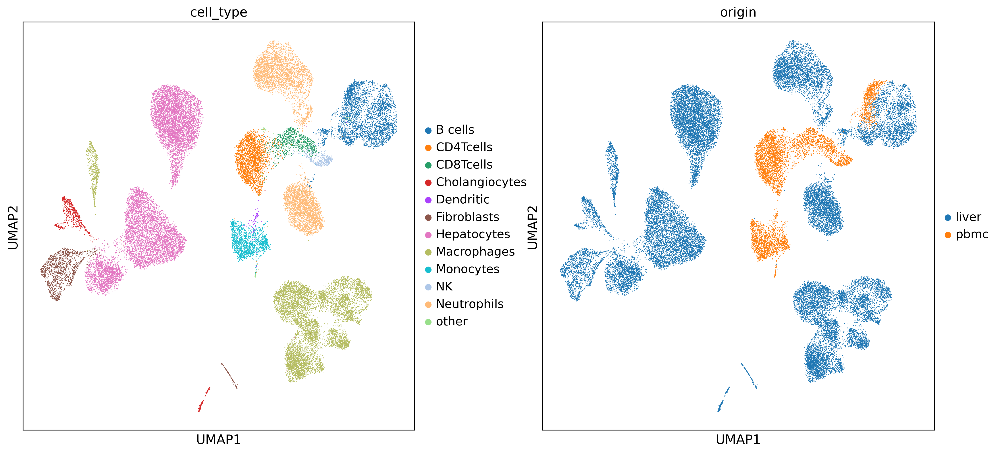

In [15]:
sc.pl.umap(adata_pseudo, color=['cell_type', 'origin'], show=False)
plt.gcf().set_size_inches(18, 8)
plt.show()

In [16]:
import harmonypy as hm 
ho = hm.run_harmony(adata_pseudo.obsm['X_pca'], adata_pseudo.obs, vars_use=['origin'])
adata_pseudo.obsm['X_harmony'] = ho.Z_corr.T 
sc.pp.neighbors(adata_pseudo, use_rep='X_harmony', n_pcs=30)
sc.tl.umap(adata_pseudo)

2025-12-17 17:52:40,977 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2025-12-17 17:52:44,610 - harmonypy - INFO - sklearn.KMeans initialization complete.
2025-12-17 17:52:44,921 - harmonypy - INFO - Iteration 1 of 10
2025-12-17 17:53:15,106 - harmonypy - INFO - Iteration 2 of 10
2025-12-17 17:53:44,209 - harmonypy - INFO - Iteration 3 of 10
2025-12-17 17:54:13,406 - harmonypy - INFO - Converged after 3 iterations


computing neighbors
    finished (0:00:03)
computing UMAP
    finished (0:03:27)


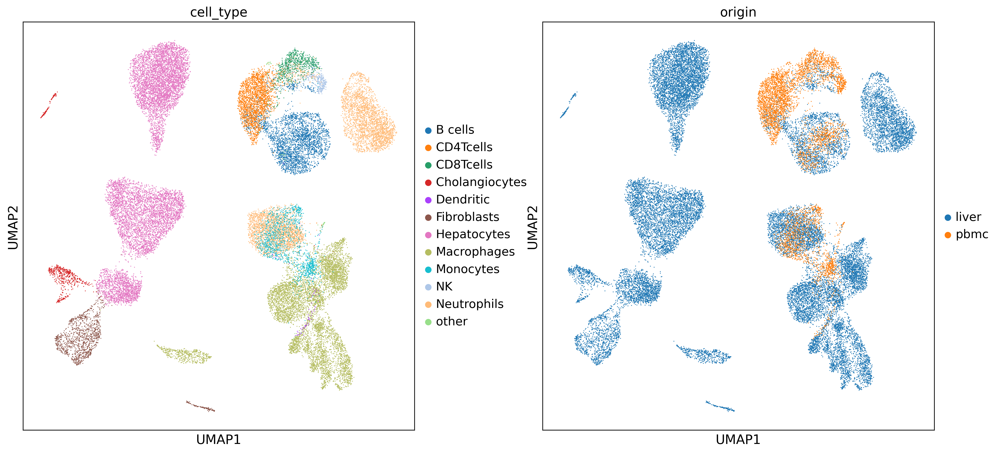

In [17]:
sc.pl.umap(adata_pseudo, color=['cell_type', 'origin'], show=False)
plt.gcf().set_size_inches(18, 8)
plt.show()

### train ###

In [13]:
import torch
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cuda


In [14]:
# 3. 高分散遺伝子（HVG）の抽出
# 全遺伝子で学習すると重すぎる＆ノイズが入るため、通常は上位2000-4000遺伝子に絞ります
sc.pp.highly_variable_genes(
    combined_adata,
    n_top_genes=3000,
    batch_key="origin", # バッチごとに分散を見て選ぶ
    subset=True         # 学習用にサブセット化（全遺伝子戻したい場合は後述の補足参照）
)

extracting highly variable genes
    finished (0:00:05)


In [15]:
from scvi.external import SysVI

https://github.com/scverse/scvi-tools/blob/main/src/scvi/external/sysvi/_model.py  
を参考

In [16]:
combined_adata

AnnData object with n_obs × n_vars = 32699 × 3000
    obs: 'pct_counts_mt', 'n_genes_by_counts', 'predicted_doublet', 'log1p_total_counts_hb', 'pct_counts_in_top_50_genes', 'doublet_score', 'total_counts', 'total_counts_ribo', 'pct_counts_hb', 'pct_counts_in_top_100_genes', 'n_genes', 'pct_counts_in_top_500_genes', 'pct_counts_in_top_200_genes', 'total_counts_mt', 'log1p_n_genes_by_counts', 'total_counts_hb', 'log1p_total_counts_ribo', 'cell_type', 'pct_counts_ribo', 'log1p_total_counts', 'log1p_total_counts_mt', 'origin'
    var: 'n_cells_by_counts', 'ribo', 'pct_dropout_by_counts', 'log1p_mean_counts', 'mean_counts', 'mt', 'log1p_total_counts', 'hb', 'n_cells', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'log1p', 'hvg'

In [17]:
# SysVIクラスは定義済みとする

# モデルセットアップ
SysVI.setup_anndata(
    combined_adata,
    batch_key="origin",            # ここに 'Liver' / 'PBMC' の列を指定
    categorical_covariate_keys=[], # もしドナーIDなど他のバッチがあればここに追加
    layer=None                     # .X (log1p正規化済み) を使用
)

# モデル初期化（VampPrior使用）
model = SysVI(
    combined_adata,
    prior="vamp",
    n_prior_components=10
)

# 学習
model.train(
    max_epochs=300,
    early_stopping=True,
    # ▼ GPU設定
    accelerator="gpu",
    devices=1,
    batch_size=4096,  
)

INFO     The model has been initialized                                                                            


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
You are using a CUDA device ('NVIDIA RTX A6000') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/opt/250102_test_env/lib/python3.11/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:433: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=27` in the `DataLoader` to improve performance.
/opt/250102_test_env/lib/python3.11/site-packages/lightning/pytorch/loops/fit_loop.py:310: The number of training batches (8) is smaller than the logging interval Trainer(log_every_n_steps=10). Set a lower val

Training:   0%|          | 0/300 [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=300` reached.


In [34]:
combined_adata.obs["origin"]

AAACCTGAGCTTTGGT-1-liver    liver
AAAGATGCAAAGGAAG-1-liver    liver
AAAGCAAGTACCGAGA-1-liver    liver
AAAGTAGAGTACGCGA-1-liver    liver
AAATGCCGTCTGCAAT-1-liver    liver
                            ...  
TTTGCATGCACTAG-1-pbmc        pbmc
TTTGCATGCCGAAT-1-pbmc        pbmc
TTTGCATGGAGGTG-1-pbmc        pbmc
TTTGCATGGATAAG-1-pbmc        pbmc
TTTGCATGGGCATT-1-pbmc        pbmc
Name: origin, Length: 32699, dtype: category
Categories (2, object): ['liver', 'pbmc']

In [ ]:
from scvi import REGISTRY_KEYS

def get_sysvi_corrected_robust(model, adata, target_batch_name, layer_name="counts"):
    """
    SysVIモデルのEncoder/Decoderを直接呼び出して補正を行う関数 (V5: Direct Bypass)
    """
    # 1. モデルを評価モードへ
    module = model.module
    module.eval()
    device = list(module.parameters())[0].device # moduleはdeviceを持たないため最初のパラメータの場所を取得
    
    # 2. 入力データ (X) の作成
    if layer_name in adata.layers:
        x_data = adata.layers[layer_name]
    elif layer_name == "X":
        x_data = adata.X
    else:
        x_data = adata.X
        
    if hasattr(x_data, "toarray"): # スパースな行列に対する処理
        x_data = x_data.toarray()
    
    # PyTorchテンソル化
    x_tensor = torch.from_numpy(x_data).float().to(device)
    n_obs = x_tensor.shape[0]
    
    # 3. バッチID (batch_index) の作成
    # 学習時の0, 1みたいなバッチとliver, pbmcのようなバッチラベルを揃える
    registry = model.adata_manager.get_state_registry(REGISTRY_KEYS.BATCH_KEY)
    mapping = registry.categorical_mapping
    
    batch_series = adata.obs[registry.original_key].astype("category")
    batch_series = batch_series.cat.set_categories(mapping)
    real_batch_indices = torch.from_numpy(batch_series.cat.codes.values).long().to(device).unsqueeze(1)
    
    # 4. ターゲットバッチID の作成
    try:
        target_id = np.where(mapping == target_batch_name)[0][0]
    except IndexError:
        raise ValueError(f"バッチ '{target_batch_name}' が見つかりません。登録バッチ: {mapping}")
    
    target_batch_indices = torch.full((n_obs, 1), target_id, device=device).long()
    
    # 5. 推論と生成 (ラッパー関数をバイパスして直接実行)
    with torch.no_grad():
        # === Step A: Encoder ===
        # module.encoder は EncoderDecoder クラスのインスタンスです
        # ここに直接、必要な引数を渡します
        # cat_list は必ず「リスト」である必要があります。空なら [] です。
        encoder_outputs = module.encoder(
            x=x_tensor,
            batch_index=real_batch_indices,
            cat_list=[],  # 空リスト (Noneはダメ)
            cont=None     # 連続変数は None
        )
        
        # 潜在変数 z 
        # (分布そのものではなくoutputs["q_dist"].rsample()で分布から得られたノイズ込みのサンプリングデータ)
        # (平均にしたいようであればz = encoder_outputs["q_dist"].mean)
        # 正直学習じゃないのでencoder_outputs["q_dist"].meanでもいいかも
        # sample=Trueの部分を変えての変更も可能
        z = encoder_outputs["q"]
        
        # === Step B: Decoder ===
        # module.decoder も EncoderDecoder クラスのインスタンスです
        # ターゲットのバッチIDを渡して復元します
        decoder_outputs = module.decoder(
            x=z,
            batch_index=target_batch_indices,
            cat_list=[],  # 空リスト
            cont=None     # None
        )
        
        # 値の取り出し
        # Decoderの出力は通常 "q_dist" (分布) または "q" (値) などが含まれます
        if "q_dist" in decoder_outputs: # とりあえずは分布を取り出し、その平均を補正済みの発現量とする
            dist = decoder_outputs["q_dist"]
            if hasattr(dist, "mean"):
                corrected_values = dist.mean.cpu().numpy()
            else:
                corrected_values = dist.cpu().numpy()

        elif "q" in decoder_outputs: # 上手くいかないときのため、outputs["q_dist"].rsample()を入れておく
            corrected_values = decoder_outputs["q"].cpu().numpy()
            
        else:
             raise KeyError(f"出力キーが見つかりません: {decoder_outputs.keys()}")

    # 6. DataFrame化
    corrected_df = pd.DataFrame(
        corrected_values,
        index=adata.obs_names,
        columns=adata.var_names
    )
    
    return corrected_df

https://github.com/scverse/scvi-tools/blob/main/src/scvi/external/sysvi/_module.py  
を参考

In [36]:
# === 実行 ===
# 全員を "liver" の条件に合わせて補正
corrected_df = get_sysvi_corrected_robust(
    model, 
    combined_adata, 
    target_batch_name="liver", 
    layer_name="X"
)

In [37]:
corrected_df.head()

,7SK.2,AAGAB,AATK,ABCA7,ABCC12,ABCC4,ABCD4,ABCG1,ABHD17A,ABHD3,...,ZNF747,ZNF792,ZNF80,ZNF800,ZNF845,ZNF883,ZNF93,ZNFX1,ZSCAN18,hsa-mir-1199
AAACCTGAGCTTTGGT-1-liver,0.336224,0.023909,0.010714,0.038651,0.000385,0.009452,0.099763,0.082984,0.102030,0.051201,...,0.019373,0.003381,0.001671,0.165768,0.008229,0.008508,0.034320,0.048800,0.120125,-0.000345
AAAGATGCAAAGGAAG-1-liver,0.243811,0.022856,0.015081,0.039241,-0.001675,-0.001289,0.087996,0.094864,0.074359,0.051645,...,0.014415,-0.000015,0.003084,0.126931,0.006930,0.006524,0.023728,0.059748,0.089184,0.001083
AAAGCAAGTACCGAGA-1-liver,0.454385,0.012619,0.020766,0.036322,0.002272,0.013174,0.065400,0.107669,0.133645,0.078713,...,0.033579,0.002707,0.009468,0.131415,0.006077,0.003134,0.013324,0.076114,0.085380,0.010412
AAAGTAGAGTACGCGA-1-liver,0.321668,0.032185,0.010753,0.012588,0.002534,0.053881,0.112225,0.135585,0.138326,0.116114,...,0.025901,0.008740,0.004704,0.153397,0.021856,0.004090,0.008557,0.072175,0.058422,0.004437
AAATGCCGTCTGCAAT-1-liver,0.401973,0.028086,0.008219,0.020216,0.004121,0.058504,0.113044,0.149532,0.184761,0.095278,...,0.030990,0.007088,0.002543,0.160161,0.018411,0.003441,0.013229,0.086416,0.061550,0.002255


In [38]:
adata_corrected = combined_adata[:, combined_adata.var.highly_variable].copy()

In [39]:
adata_corrected.X = corrected_df.values

In [40]:
# 3. データをスケール
sc.pp.scale(adata_corrected, max_value=10)

# 4. PCAを実行
sc.pp.pca(adata_corrected, n_comps=50)

# 5. 近傍グラフを計算
sc.pp.neighbors(adata_corrected, n_pcs=30)

# 6. UMAPを計算
sc.tl.umap(adata_corrected)

computing PCA
    with n_comps=50
    finished (0:01:12)
computing neighbors
    using 'X_pca' with n_pcs = 30
    finished (0:00:09)
computing UMAP
    finished (0:05:09)


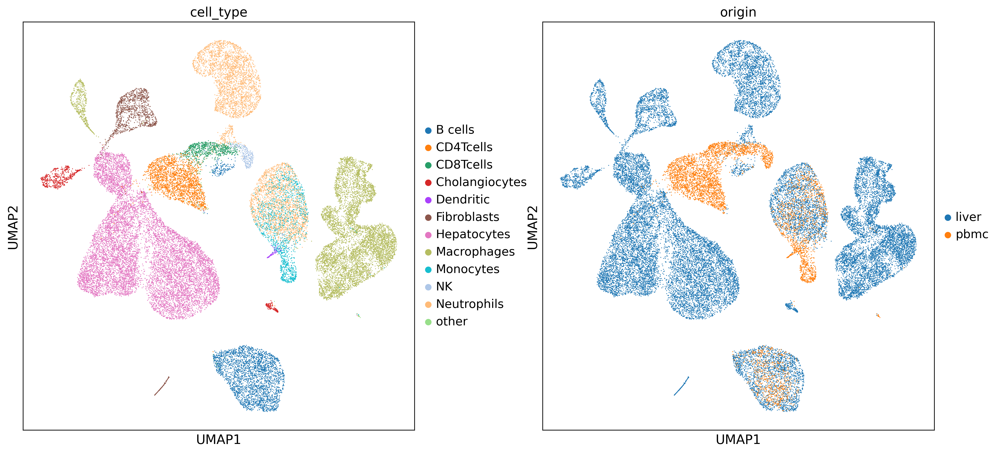

In [41]:
sc.pl.umap(adata_corrected, color=['cell_type', 'origin'], show=False)
plt.gcf().set_size_inches(18, 8)
plt.show()

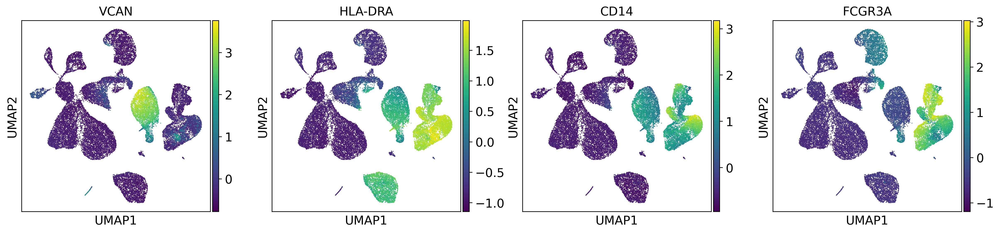

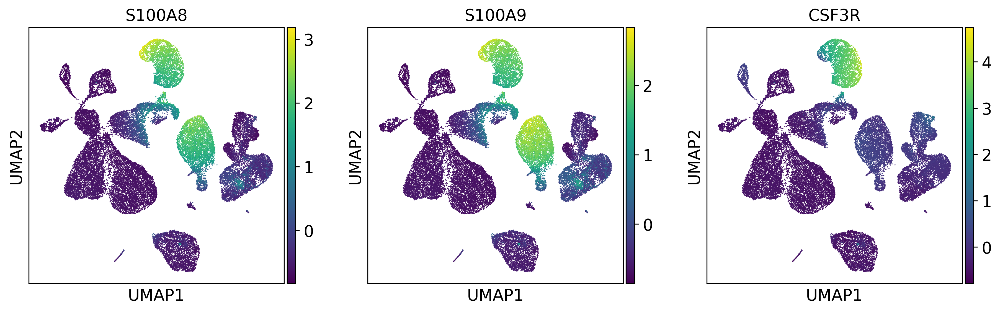

In [46]:
marker_dict = {
    "Mo/Mac": ["VCAN", "HLA-DRA", "CD14", "FCGR3A"],
    "Neu": ["S100A8", "S100A9", "CSF3R"],
}

for k in marker_dict:
    sc.pl.umap(adata_corrected, color=marker_dict[k])

NeuとMonがかぶっている以外は割と良さそう

多少B細胞も上のあたりに分かれてしまっているか？

ただ、HVGsの選別過程でCYPとかALBが落ちているのは気になる、この辺は明示的に与えてもよいかも？

In [43]:
adata_corrected

AnnData object with n_obs × n_vars = 32699 × 3000
    obs: 'pct_counts_mt', 'n_genes_by_counts', 'predicted_doublet', 'log1p_total_counts_hb', 'pct_counts_in_top_50_genes', 'doublet_score', 'total_counts', 'total_counts_ribo', 'pct_counts_hb', 'pct_counts_in_top_100_genes', 'n_genes', 'pct_counts_in_top_500_genes', 'pct_counts_in_top_200_genes', 'total_counts_mt', 'log1p_n_genes_by_counts', 'total_counts_hb', 'log1p_total_counts_ribo', 'cell_type', 'pct_counts_ribo', 'log1p_total_counts', 'log1p_total_counts_mt', 'origin', '_scvi_batch'
    var: 'n_cells_by_counts', 'ribo', 'pct_dropout_by_counts', 'log1p_mean_counts', 'mean_counts', 'mt', 'log1p_total_counts', 'hb', 'n_cells', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection', 'mean', 'std'
    uns: 'log1p', 'hvg', '_scvi_uuid', '_scvi_manager_uuid', 'pca', 'neighbors', 'umap', 'cell_type_colors', 'origin_colors'
    obsm: 'X_pca', 'X_umap'
    var

In [44]:
# データ保存
adata_corrected.write("/workspace/251217_sysvi_integration/result/result_32699x3000.h5ad")